<a href="https://colab.research.google.com/github/MonsterDeveloper/real-time-trash-sorting/blob/main/Container%20Type%20Detector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Unify 3 datasets
1. [Beverage Containers](https://universe.roboflow.com/roboflow-universe-projects/beverage-containers-3atxb/dataset/3)
2. [Reverse Vending Machine](https://universe.roboflow.com/reverse-vending-machine-lqerh/reverse-vending-machine-ogew0/dataset/1)
3. [Drinking Waste Classification](https://www.kaggle.com/datasets/arkadiyhacks/drinking-waste-classification)

In [ ]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.0/250.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 91.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 85.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.18
    Uninstalling idna-3.18:
      Successfully uninstalled idna-3.18


In [ ]:
from roboflow import Roboflow
from google.colab import userdata

rf = Roboflow(api_key=userdata.get('ROBOFLOW_API_KEY'))
project = rf.workspace("roboflow-universe-projects").project("beverage-containers-3atxb")
version = project.version(3)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Beverage-Containers-3 in yolov8:: 100%|██████████| 31302/31302 [00:08<00:00, 3594.26it/s]


In [ ]:
import kagglehub

drinking_waste_path = kagglehub.dataset_download("arkadiyhacks/drinking-waste-classification")

print("Path to dataset files:", drinking_waste_path)

100%|██████████| 1.50G/1.50G [01:21<00:00, 19.7MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/arkadiyhacks/drinking-waste-classification/versions/2


In [ ]:
!mv /root/.cache/kagglehub/datasets/arkadiyhacks/drinking-waste-classification/versions/2 /content/drinking-waste-classification

In [ ]:
project = rf.workspace("reverse-vending-machine-lqerh").project("reverse-vending-machine-ogew0")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Reverse-vending-machine-1 in yolov8:: 100%|██████████| 2059/2059 [00:00<00:00, 5436.33it/s]


In [ ]:
!apt-get install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 3 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 0s (1,483 kB/s)
Selecting previously unselected package tree.
(Reading database ... 118243 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [ ]:
!tree -L 4 --filelimit 10
!echo "============"
!cat Beverage-Containers-3/data.yaml
!echo "============"
!cat Reverse-vending-machine-1/data.yaml
!echo "============"
!cat Beverage-Containers-3/test/labels/000000002106_jpg.rf.422cea1f9671e91100efce18b983e937.txt
!echo "============"
!cat drinking-waste-classification/Images_of_Waste/YOLO_imgs/AluCan1,000.txt

.
├── Beverage-Containers-3
│   ├── data.yaml
│   ├── README.dataset.txt
│   ├── README.roboflow.txt
│   ├── test
│   │   ├── images  [653 entries exceeds filelimit, not opening dir]
│   │   └── labels  [653 entries exceeds filelimit, not opening dir]
│   ├── train
│   │   ├── images  [13689 entries exceeds filelimit, not opening dir]
│   │   └── labels  [13689 entries exceeds filelimit, not opening dir]
│   └── valid
│       ├── images  [1303 entries exceeds filelimit, not opening dir]
│       └── labels  [1303 entries exceeds filelimit, not opening dir]
├── drinking-waste-classification
│   └── Images_of_Waste
│       ├── rawimgs
│       │   ├── AluCan
│       │   ├── Glass
│       │   ├── HDPEM
│       │   └── PET
│       └── YOLO_imgs  [9640 entries exceeds filelimit, not opening dir]
└── Reverse-vending-machine-1
    ├── data.yaml
    ├── README.dataset.txt
    ├── README.roboflow.txt
    ├── test
    │   ├── images  [60 entries exceeds filelimit, not opening dir]
    │   └── labe

In [ ]:
import os

# List some files from the third dataset to see naming patterns
dwc_path = '/content/drinking-waste-classification/Images_of_Waste/YOLO_imgs'
files = os.listdir(dwc_path)

print("Sample files in drinking-waste-classification:")
for f in sorted(files)[:20]:
    print(f)

# Inspect label files for different categories to identify class IDs
categories = ['AluCan', 'Glass', 'HDPEM', 'PET']
for cat in categories:
    # Find first txt file starting with category name
    sample_txt = next((f for f in files if f.startswith(cat) and f.endswith('.txt')), None)
    if sample_txt:
        print(f"\nContent of {sample_txt}:")
        with open(os.path.join(dwc_path, sample_txt), 'r') as f:
            print(f.read().strip())

Sample files in drinking-waste-classification:
AluCan1,000.jpg
AluCan1,000.txt
AluCan1,001.jpg
AluCan1,001.txt
AluCan1,002.jpg
AluCan1,002.txt
AluCan1,003.jpg
AluCan1,003.txt
AluCan1,004.jpg
AluCan1,004.txt
AluCan1,005.jpg
AluCan1,005.txt
AluCan1,006.jpg
AluCan1,006.txt
AluCan1,007.jpg
AluCan1,007.txt
AluCan1,008.jpg
AluCan1,008.txt
AluCan1,009.jpg
AluCan1,009.txt

Content of AluCan30.txt:
0 0.5546875 0.54296875 0.73828125 0.9140625

Content of Glass960.txt:
1 0.474609375 0.6142020497803806 0.39453125 0.31771595900439237

Content of HDPEM23.txt:
2 0.5244140625 0.4388020833333333 0.947265625 0.8932291666666666

Content of PET1,350.txt:
3 0.69140625 0.48316251830161056 0.1796875 0.26939970717423134


In [ ]:
import yaml

def check_dataset_info(path, name):
    yaml_path = os.path.join(path, 'data.yaml')
    print(f"--- {name} YAML Info ---")
    if os.path.exists(yaml_path):
        with open(yaml_path, 'r') as f:
            data = yaml.safe_load(f)
            for i, class_name in enumerate(data.get('names', [])):
                print(f"ID {i}: {class_name}")

    # Check a few random labels to see what IDs are actually appearing
    label_dir = os.path.join(path, 'train/labels')
    if os.path.exists(label_dir):
        print(f"\nSample label IDs in {name} (train):")
        sample_labels = os.listdir(label_dir)[:5]
        for lbl in sample_labels:
            with open(os.path.join(label_dir, lbl), 'r') as f:
                lines = f.readlines()
                ids = sorted(list(set([line.split()[0] for line in lines])))
                print(f"{lbl}: {ids}")
    print("\n")

check_dataset_info('Beverage-Containers-3', 'Beverage-Containers-3')
check_dataset_info('Reverse-vending-machine-1', 'Reverse-vending-machine-1')

--- Beverage-Containers-3 YAML Info ---
ID 0: bottle-glass
ID 1: bottle-plastic
ID 2: cup-disposable
ID 3: cup-handle
ID 4: glass-mug
ID 5: glass-normal
ID 6: glass-wine
ID 7: gym bottle
ID 8: tin can

Sample label IDs in Beverage-Containers-3 (train):
56dark1_jpg.rf.5a2fa858d929c23a1c340f28f9560f1f.txt: ['0']
b2eb80b88704f559_jpg.rf.a3a66e14d40d62f893f0f84bf85f6d12.txt: ['3', '5', '8']
000000400742_jpg.rf.0dd29d0915907a46697c447b8da96487.txt: ['5']
000000400742_jpg.rf.214944f6cbdfdf21088b76a8ded16e5d.txt: ['5']
555c96996c26d74d_jpg.rf.161d621313b72838244df82d6ccfab6f.txt: ['3']


--- Reverse-vending-machine-1 YAML Info ---
ID 0: bottle
ID 1: can
ID 2: paper cup
ID 3: paper pack
ID 4: pet

Sample label IDs in Reverse-vending-machine-1 (train):
17_X001_C013_1016_0_jpg.rf.2a249e6569e8943a580bd8d64fa7c90a.txt: ['0']
21_X106_C172_0107_0_jpg.rf.b3d9c671cc59f77c327fc70744d4c586.txt: ['2']
21_X178_C172_0107_3_jpg.rf.dd043f3af9962389fe5b8bcdc2a3efd0.txt: ['3']
23_X002_C026_1013_4_jpg.rf.12492a

In [ ]:
import os
import shutil
from pathlib import Path

# Unified Taxonomy: 0: plastic_bottle, 1: glass_bottle, 2: can, 3: carton
UNIFIED_CLASSES = ['plastic_bottle', 'glass_bottle', 'can', 'carton']

# Verified Mappings
map_bc3 = {0: 1, 1: 0, 8: 2}
map_rvm = {0: 0, 1: 2, 3: 3, 4: 0}
map_dwc = {0: 2, 1: 1, 2: 0, 3: 0}

def process_source(src_root, mapping, prefix, subdirs=['train', 'valid', 'test']):
    img_dest = Path('/content/unified_dataset/images')
    lbl_dest = Path('/content/unified_dataset/labels')
    img_dest.mkdir(parents=True, exist_ok=True)
    lbl_dest.mkdir(parents=True, exist_ok=True)

    # Handle source 3 which doesn't follow train/test subfolder structure in YOLO_imgs
    if 'drinking-waste' in src_root:
        src_lbl_dir = Path(src_root) / 'Images_of_Waste/YOLO_imgs'
        src_img_dir = src_lbl_dir
        remap_files(src_img_dir, src_lbl_dir, img_dest, lbl_dest, mapping, prefix)
    else:
        for sub in subdirs:
            src_img_dir = Path(src_root) / sub / 'images'
            src_lbl_dir = Path(src_root) / sub / 'labels'
            if src_img_dir.exists() and src_lbl_dir.exists():
                remap_files(src_img_dir, src_lbl_dir, img_dest, lbl_dest, mapping, f"{prefix}_{sub}")

def remap_files(src_img_dir, src_lbl_dir, img_dest, lbl_dest, mapping, prefix):
    for lbl_file in Path(src_lbl_dir).glob('*.txt'):
        new_lines = []
        with open(lbl_file, 'r') as f:
            for line in f:
                parts = line.split()
                if not parts: continue
                cls_id = int(parts[0])
                if cls_id in mapping:
                    parts[0] = str(mapping[cls_id])
                    new_lines.append(" ".join(parts))

        if new_lines:
            # Try finding the image
            for ext in ['.jpg', '.jpeg', '.png', '.JPG']:
                img_file = Path(src_img_dir) / (lbl_file.stem + ext)
                if img_file.exists():
                    new_name = f"{prefix}_{img_file.name}"
                    shutil.copy(img_file, img_dest / new_name)
                    with open(lbl_dest / f"{prefix}_{lbl_file.stem}.txt", 'w') as out_f:
                        out_f.write("\n".join(new_lines))
                    break

# Execute Unification
if os.path.exists('/content/unified_dataset'): shutil.rmtree('/content/unified_dataset')

print("Processing Beverage-Containers-3...")
process_source('/content/Beverage-Containers-3', map_bc3, 'bc3')

print("Processing Reverse-vending-machine-1...")
process_source('/content/Reverse-vending-machine-1', map_rvm, 'rvm')

print("Processing Drinking-Waste...")
process_source('/content/drinking-waste-classification', map_dwc, 'dwc')

# Create data.yaml
with open('/content/unified_dataset/data.yaml', 'w') as f:
    f.write(f"path: /content/unified_dataset\ntrain: images\nval: images\n\nnc: {len(UNIFIED_CLASSES)}\nnames: {UNIFIED_CLASSES}")

print(f"\nSuccess! Unified dataset contains {len(os.listdir('/content/unified_dataset/images'))} images.")

Processing Beverage-Containers-3...
Processing Reverse-vending-machine-1...
Processing Drinking-Waste...

Success! Unified dataset contains 11138 images.


--- Previewing category: plastic_bottle ---


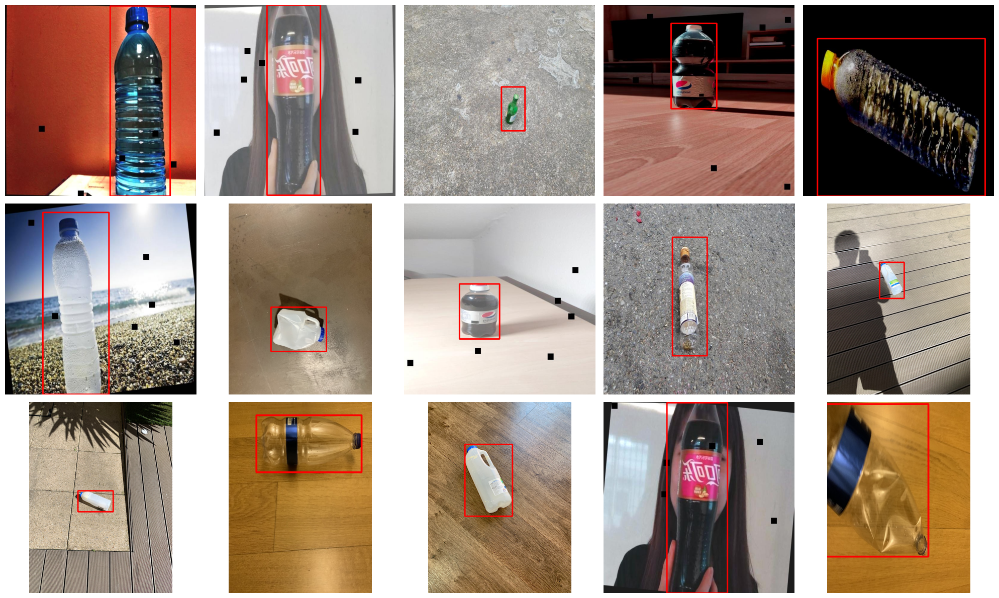

--- Previewing category: glass_bottle ---


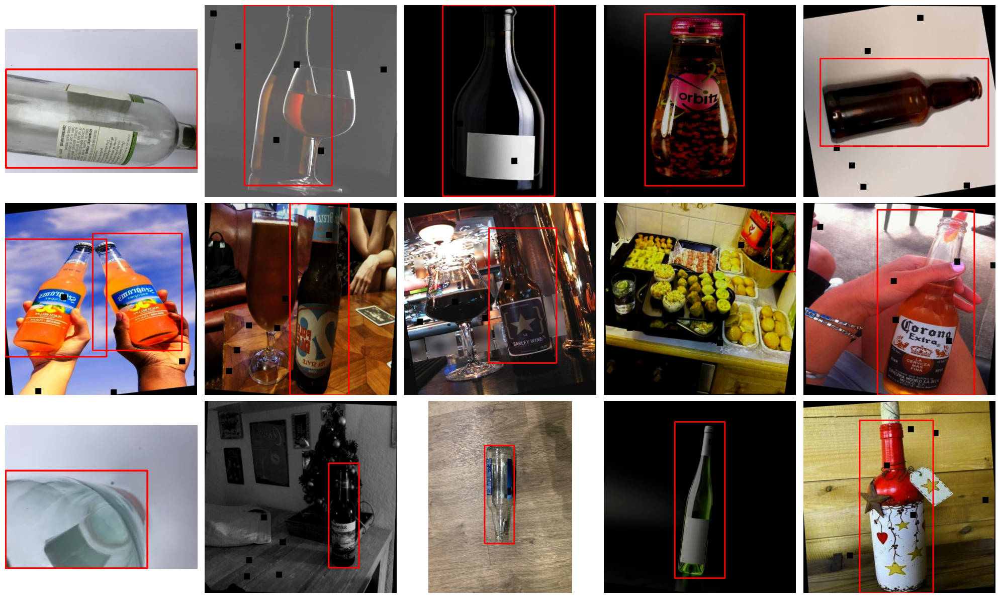

--- Previewing category: can ---


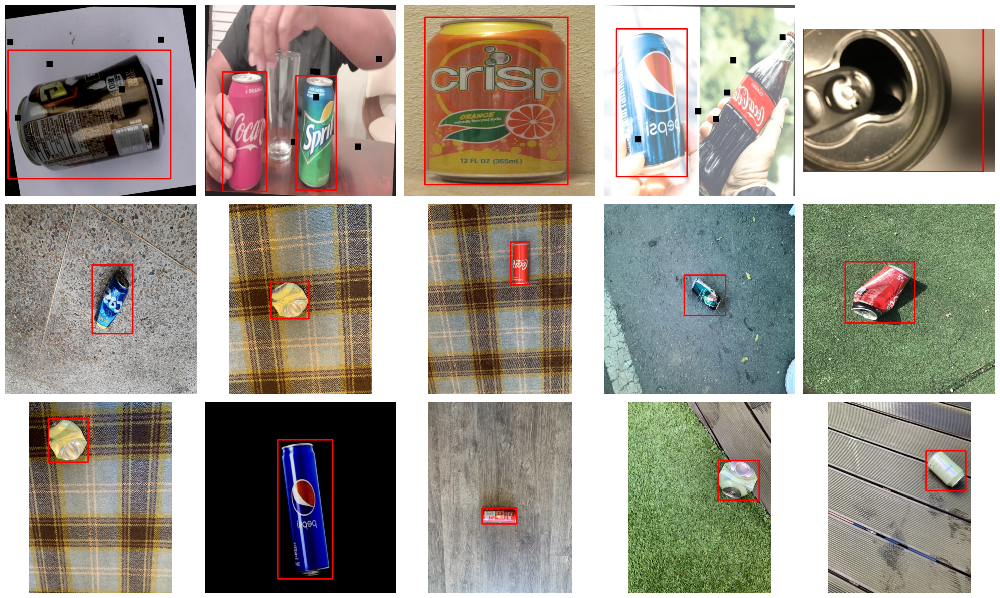

--- Previewing category: carton ---


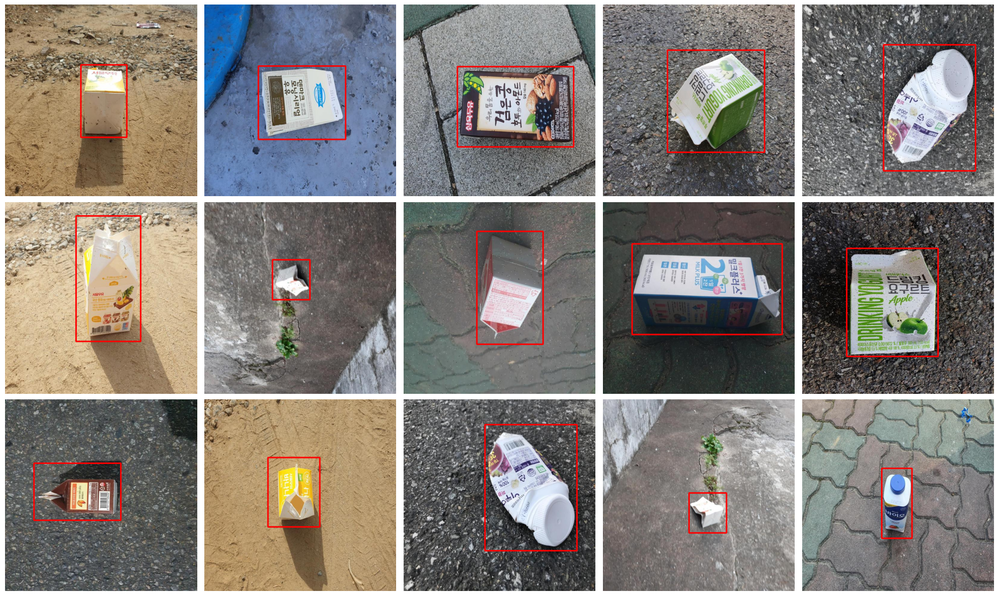

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

def plot_random_samples(dataset_path, classes, num_samples=15):
    img_dir = Path(dataset_path) / 'images'
    lbl_dir = Path(dataset_path) / 'labels'

    # Group image files by their predominant class (simplified for preview)
    class_samples = {i: [] for i in range(len(classes))}

    all_labels = list(lbl_dir.glob('*.txt'))
    random.shuffle(all_labels)

    for lbl_path in all_labels:
        with open(lbl_path, 'r') as f:
            lines = f.readlines()
            if not lines: continue
            cls_id = int(lines[0].split()[0]) # Take first object's class for grouping
            if cls_id in class_samples and len(class_samples[cls_id]) < num_samples:
                # Find image
                for ext in ['.jpg', '.jpeg', '.png', '.JPG']:
                    img_path = img_dir / (lbl_path.stem + ext)
                    if img_path.exists():
                        class_samples[cls_id].append((str(img_path), str(lbl_path)))
                        break

    # Plotting
    for cls_id, samples in class_samples.items():
        if not samples: continue

        print(f"--- Previewing category: {classes[cls_id]} ---")
        plt.figure(figsize=(20, 12))
        for i, (img_p, lbl_p) in enumerate(samples):
            img = cv2.imread(img_p)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            h, w, _ = img.shape

            with open(lbl_p, 'r') as f:
                for line in f:
                    c, x, y, bw, bh = map(float, line.split())
                    if int(c) == cls_id:
                        x1 = int((x - bw/2) * w)
                        y1 = int((y - bh/2) * h)
                        x2 = int((x + bw/2) * w)
                        y2 = int((y + bh/2) * h)
                        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)

            plt.subplot(3, 5, i + 1)
            plt.imshow(img)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

plot_random_samples('/content/unified_dataset', UNIFIED_CLASSES, num_samples=15)

In [ ]:
!zip -r unified_dataset.zip unified_dataset

Streaming output truncated to the last 5000 lines.
  adding: unified_dataset/images/bc3_train_000648_jpg.rf.821d52842bad1da8b25d32f1ce37d7d1.jpg (deflated 1%)
  adding: unified_dataset/images/dwc_HDPEM834.jpg (deflated 0%)
  adding: unified_dataset/images/dwc_PET1,455.jpg (deflated 1%)
  adding: unified_dataset/images/rvm_train_21_X171_C172_0107_3_jpg.rf.36db8f22bfd33905fc4b18498366c909.jpg (deflated 1%)
  adding: unified_dataset/images/dwc_AluCan697.jpg (deflated 1%)
  adding: unified_dataset/images/dwc_Glass1,019.jpg (deflated 0%)
  adding: unified_dataset/images/bc3_train_000000467973_jpg.rf.52f6917ffe5402508e5b5ff315f3ee02.jpg (deflated 8%)
  adding: unified_dataset/images/dwc_HDPEM385.jpg (deflated 1%)
  adding: unified_dataset/images/dwc_Glass61.jpg (deflated 2%)
  adding: unified_dataset/images/bc3_train_PET496_jpg.rf.667ec7fe1519b494db36887b45c1f7f7.jpg (deflated 0%)
  adding: unified_dataset/images/dwc_HDPEM426.jpg (deflated 1%)
  adding: unified_dataset/images/dwc_HDPEM737.jp

# 2. Train YOLOv8n Container Detector

Fine-tune a COCO-pretrained YOLOv8n (~3M params) on the unified pool.  
Steps:
1. Audit class distribution
2. Stratified 80/10/10 resplit (by majority class per image)
3. Fine-tune from `yolov8n.pt`
4. Evaluate on held-out test split
5. Export to CoreML fp16 with embedded NMS

In [1]:
import os
import zipfile
import shutil
from pathlib import Path

# ── Re-declare variables from Section 1 ───────────────────────────────────────
UNIFIED_CLASSES = ['plastic_bottle', 'glass_bottle', 'can', 'carton']

# ── Unzip the manually-uploaded dataset ───────────────────────────────────────
# Upload unified_dataset.zip via the Colab Files panel
# (left sidebar → Files icon → Upload), then run this cell.
ZIP_PATH = '/content/unified_container_type_dataset.zip'

if not os.path.exists(ZIP_PATH):
    raise FileNotFoundError(
        f"{ZIP_PATH} not found.\n"
        "Upload dataset zip via the Colab Files panel "
        "(left sidebar → Files icon → Upload button) and re-run this cell."
    )

dest = Path('/content/unified_dataset')
if dest.exists():
    shutil.rmtree(dest)

with zipfile.ZipFile(ZIP_PATH) as z:
    z.extractall('/content/')

print(f"Unzipped → {dest}")
print(f"  images : {len(list((dest / 'images').iterdir()))}")
print(f"  labels : {len(list((dest / 'labels').iterdir()))}")

Unzipped → /content/unified_dataset
  images : 11138
  labels : 11138


In [2]:
!pip install -q ultralytics

import torch
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 30.1 MB/s eta 0:00:00
CUDA available: True
GPU: Tesla T4


In [3]:
from pathlib import Path
from collections import Counter

UNIFIED_CLASSES = ['plastic_bottle', 'glass_bottle', 'can', 'carton']
lbl_dir = Path('/content/unified_dataset/labels')

bbox_counts = Counter()
img_class_sets = []

for lbl_file in sorted(lbl_dir.glob('*.txt')):
    classes_in_img = set()
    with open(lbl_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if parts:
                cls = int(parts[0])
                bbox_counts[cls] += 1
                classes_in_img.add(cls)
    img_class_sets.append(classes_in_img)

total_boxes = sum(bbox_counts.values())
print(f"Total images: {len(img_class_sets)}")
print(f"Total bounding boxes: {total_boxes}")
print(f"Multi-class images: {sum(1 for s in img_class_sets if len(s) > 1)}\n")
print("Bounding-box distribution:")
for cls_id, count in sorted(bbox_counts.items()):
    bar = '█' * int(40 * count / total_boxes)
    print(f"  {cls_id} {UNIFIED_CLASSES[cls_id]:20s} {count:6d}  {100*count/total_boxes:5.1f}%  {bar}")

Total images: 11138
Total bounding boxes: 13704
Multi-class images: 148

Bounding-box distribution:
  0 plastic_bottle         5516   40.3%  ████████████████
  1 glass_bottle           4419   32.2%  ████████████
  2 can                    3586   26.2%  ██████████
  3 carton                  183    1.3%  


In [4]:
import os
import shutil
from pathlib import Path
from collections import Counter
from sklearn.model_selection import train_test_split

UNIFIED_CLASSES = ['plastic_bottle', 'glass_bottle', 'can', 'carton']
lbl_dir = Path('/content/unified_dataset/labels')
img_dir = Path('/content/unified_dataset/images')

def get_majority_class(label_path):
    counts = Counter()
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if parts:
                counts[int(parts[0])] += 1
    return counts.most_common(1)[0][0] if counts else -1

samples, labels = [], []
for lbl_file in sorted(lbl_dir.glob('*.txt')):
    cls = get_majority_class(lbl_file)
    if cls == -1:
        continue
    for ext in ['.jpg', '.jpeg', '.png', '.JPG']:
        img_file = img_dir / (lbl_file.stem + ext)
        if img_file.exists():
            samples.append((str(img_file), str(lbl_file)))
            labels.append(cls)
            break

print(f"Samples with valid labels: {len(samples)}")
print("Majority-class distribution:", dict(sorted(Counter(labels).items())))

# 80 / 10 / 10 stratified split
train_s, temp_s, train_l, temp_l = train_test_split(
    samples, labels, test_size=0.20, random_state=42, stratify=labels
)
val_s, test_s, val_l, test_l = train_test_split(
    temp_s, temp_l, test_size=0.50, random_state=42, stratify=temp_l
)
print(f"\nTrain: {len(train_s)} | Val: {len(val_s)} | Test: {len(test_s)}")

Samples with valid labels: 11138
Majority-class distribution: {0: 4918, 1: 3296, 2: 2749, 3: 175}

Train: 8910 | Val: 1114 | Test: 1114


In [5]:
import yaml

SPLIT_ROOT = Path('/content/unified_dataset_split')

def copy_split(file_pairs, split_name):
    img_dst = SPLIT_ROOT / split_name / 'images'
    lbl_dst = SPLIT_ROOT / split_name / 'labels'
    img_dst.mkdir(parents=True, exist_ok=True)
    lbl_dst.mkdir(parents=True, exist_ok=True)
    for img_path, lbl_path in file_pairs:
        shutil.copy(img_path, img_dst / Path(img_path).name)
        shutil.copy(lbl_path, lbl_dst / Path(lbl_path).name)

if SPLIT_ROOT.exists():
    shutil.rmtree(SPLIT_ROOT)

copy_split(train_s, 'train')
copy_split(val_s,   'valid')
copy_split(test_s,  'test')

data_cfg = {
    'path': str(SPLIT_ROOT),
    'train': 'train/images',
    'val':   'valid/images',
    'test':  'test/images',
    'nc': 4,
    'names': UNIFIED_CLASSES,
}
with open(SPLIT_ROOT / 'data.yaml', 'w') as f:
    yaml.dump(data_cfg, f, default_flow_style=False, sort_keys=False)

print("Split written to", SPLIT_ROOT)
for split in ['train', 'valid', 'test']:
    n = len(list((SPLIT_ROOT / split / 'images').iterdir()))
    print(f"  {split}: {n} images")

Split written to /content/unified_dataset_split
  train: 8910 images
  valid: 1114 images
  test: 1114 images


In [9]:
from ultralytics import YOLO

# model = YOLO('yolov8n.pt')  # ~3M-param COCO-pretrained backbone

model = YOLO('/content/runs/detect/container_v1/weights/last.pt')

results = model.train(
    resume=True,
    data=str(SPLIT_ROOT / 'data.yaml'),
    epochs=80,
    imgsz=640,
    batch=32,
    device=0,
    patience=10,    # stop early if val mAP stalls for 10 epochs
    project='/content/runs/detect',
    name='container_v1',
    save=True,
    plots=True,
    cache='disk'
)

Ultralytics 8.4.83 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=disk, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/unified_dataset_split/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/container_v1/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=container_v1, nbs=64, nms=False, opset=None, optim

KeyboardInterrupt: 

In [10]:
best = YOLO('/content/runs/detect/container_v1/weights/best.pt')

test_results = best.val(
    data=str(SPLIT_ROOT / 'data.yaml'),
    split='test',
    plots=True,
)

print(f"\nmAP@50:    {test_results.box.map50:.4f}")
print(f"mAP@50-95: {test_results.box.map:.4f}")
print("\nPer-class AP@50:")
for i, name in enumerate(UNIFIED_CLASSES):
    print(f"  {name:20s} {test_results.box.ap50[i]:.4f}")

Ultralytics 8.4.83 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 17.7±10.4 MB/s, size: 43.6 KB)
val: Scanning /content/unified_dataset_split/test/labels... 1114 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1114/1114 566.2it/s 2.0s
val: New cache created: /content/unified_dataset_split/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 70/70 5.8it/s 12.0s
                   all       1114       1338      0.976      0.923      0.978       0.81
        plastic_bottle        496        558      0.964      0.953      0.984      0.831
          glass_bottle        334        419      0.987      0.908      0.975      0.806
                   can        281        344      0.977      0.948      0.982      0.838
                carton         17         17      0.975  

In [11]:
best.export(
    format='coreml',
    half=True,   # fp16 weights — smaller file, runs on Apple Neural Engine
    nms=True,    # embed NMS so the .mlpackage outputs clean bounding boxes
    imgsz=640,
)

WARNING ⚠️ 'half' is deprecated and will be removed in the future. Use 'quantize' instead.
Ultralytics 8.4.83 🚀 Python-3.12.13 torch-2.11.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/runs/detect/container_v1/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (17.5 MB)
requirements: Ultralytics requirement ['coremltools>=9.0'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 388ms
Prepared 3 packages in 183ms
Installed 3 packages in 21ms
 + cattrs==26.1.0
 + coremltools==9.0
 + pyaml==26.2.1

requirements: AutoUpdate success ✅ 1.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect



/usr/local/lib/python3.12/dist-packages/coremltools/optimize/torch/palettization/fake_palettize.py:82: SyntaxWarning: invalid escape sequence '\_'
  n_bits (:obj:`int`): Number of palettization bits. There would be :math:`2^{n\_bits}` unique weights in the ``LUT``.



CoreML: starting export with coremltools 9.0...


Running MIL default pipeline:   0%|          | 0/95 [00:00<?, ? passes/s]/usr/local/lib/python3.12/dist-packages/coremltools/converters/mil/mil/passes/defs/preprocess.py:273: UserWarning: Output, '846', of the source model, has been renamed to 'var_846' in the Core ML model.
  warnings.warn(msg.format(var.name, new_name))
/usr/local/lib/python3.12/dist-packages/coremltools/converters/mil/mil/passes/defs/preprocess.py:273: UserWarning: Output, '848', of the source model, has been renamed to 'var_848' in the Core ML model.
  warnings.warn(msg.format(var.name, new_name))
Running MIL backend_mlprogram pipeline: 100%|██████████| 12/12 [00:00<00:00, 120.78 passes/s]


CoreML: starting pipeline with coremltools 9.0...
CoreML: pipeline success
CoreML: export success ✅ 23.2s, saved as '/content/runs/detect/container_v1/weights/best.mlpackage' (5.9 MB)

Export complete (23.7s)
Results saved to /content/runs/detect/container_v1/weights/best.mlpackage
Predict:         yolo predict task=detect model=/content/runs/detect/container_v1/weights/best.mlpackage imgsz=640 quantize=16
Validate:        yolo val task=detect model=/content/runs/detect/container_v1/weights/best.mlpackage imgsz=640 data=/content/unified_dataset_split/data.yaml quantize=16 
Visualize:       https://netron.app


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [12]:
!zip -r container_type_detector_v1.mlpackage.zip runs/detect/container_v1/weights/best.mlpackage

  adding: runs/detect/container_v1/weights/best.mlpackage/ (stored 0%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Data/ (stored 0%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Data/com.apple.CoreML/ (stored 0%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Data/com.apple.CoreML/model.mlmodel (deflated 88%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Data/com.apple.CoreML/weights/ (stored 0%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Data/com.apple.CoreML/weights/weight.bin (deflated 8%)
  adding: runs/detect/container_v1/weights/best.mlpackage/Manifest.json (deflated 59%)
